# **Product Recognition of Food Products**

## Image Processing and Computer Vision - Assignment Module \#1


Contacts:

- Prof. Giuseppe Lisanti -> giuseppe.lisanti@unibo.it
- Prof. Samuele Salti -> samuele.salti@unibo.it
- Alex Costanzino -> alex.costanzino@unibo.it
- Francesco Ballerini -> francesco.ballerini4@unibo.it


Computer vision-based object detection techniques can be applied in super market settings to build a system that can identify products on store shelves.
An example of how this system could be used would be to assist visually impaired customers or automate common store management tasks like detecting low-stock or misplaced products, given an image of a shelf in a store.

## Task
Develop a computer vision system that, given a reference image for each product, is able to identify such product from one picture of a store shelf.

<figure>
<a href="https://imgbb.com/">
  <center>
  <img src="https://i.ibb.co/TwkMWnH/Screenshot-2024-04-04-at-14-54-51.png" alt="Screenshot-2024-04-04-at-14-54-51" border="0" width="300" />
</a>
</figure>

For each type of product displayed in the
shelf the system should report:
1. Number of instances;
1. Dimension of each instance (width and height in pixel of the bounding box that enclose them);
1. Position in the image reference system of each instance (center of the bounding box that enclose them).

#### Example of expected output
```
Product 0 - 2 instance found:
  Instance 1 {position: (256, 328), width: 57px, height: 80px}
  Instance 2 {position: (311, 328), width: 57px, height: 80px}
Product 1 – 1 instance found:
.
.
.
```

### Track A - Single Instance Detection
Develop an object detection system to identify single instance of products given one reference image for each item and a scene image.

The system should be able to correctly identify all the product in the shelves
image.

### Track B - Multiple Instances Detection
In addition to what achieved at step A, the system should also be able to detect multiple instances of the same product.

## Data
Two folders of images are provided:
* **Models**: contains one reference image for each product that the system should be able to identify.
* **Scenes**: contains different shelve pictures to test the developed algorithm in different scenarios. The images contained in this folder are corrupted by noise.

#### Track A - Single Instance Detection
* **Models**: {ref1.png to ref14.png}.
* **Scenes**: {scene1.png to scene5.png}.

#### Track B - Multiple Instances Detection
* **Models**: {ref15.png to ref27.png}.
* **Scenes**: {scene6.png to scene12.png}.

In [171]:
from importlib.util import find_spec


try:
    from google.colab import drive
    drive.mount('/content/drive')

    !cp -r /content/drive/MyDrive/AssignmentsIPCV/dataset.zip ./
    !unzip dataset.zip
except ModuleNotFoundError:
    pass

## Evaluation criteria
1. **Procedural correctness**. There are several ways to solve the assignment. Design your own sound approach and justify every decision you make;

2. **Clarity and conciseness**. Present your work in a readable way: format your code and comment every important step;

3. **Correctness of results**. Try to solve as many instances as possible. You should be able to solve all the instances of the assignment, however, a thoroughly justified and sound procedure with a lower number of solved instances will be valued **more** than a poorly designed approach.

# ASSIGNMENT:

In [172]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

models_path="dataset/models/"
scenes_path="dataset/scenes/"

products_a=[f"{models_path}ref{i}.png" for i in range(1,15)]
products_b=[f"{models_path}ref{i}.png" for i in range(15,28)]

scenes_a=[f"{scenes_path}scene{i}.png" for i in range(1,6)]
scenes_b=[f"{scenes_path}scene{i}.png" for i in range(6,13)]

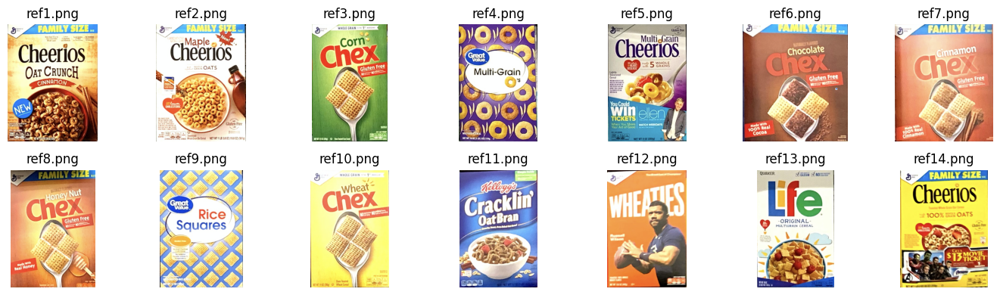

In [173]:
fig, axes = plt.subplots(2, 7, figsize=(14, 4))
axes = axes.flatten()

for i, image in enumerate(products_a):
    axes[i].imshow(cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2RGB))
    axes[i].axis('off')
    axes[i].set_title(image[len(models_path):])

plt.tight_layout()
plt.show()

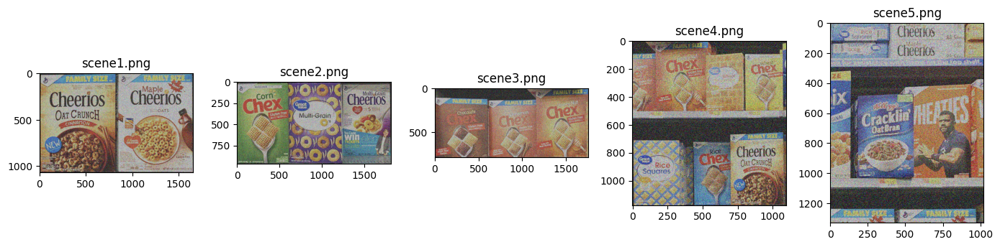

In [174]:
fig, axes = plt.subplots(1, 5, figsize=(14, 4))
axes = axes.flatten()

for i, image in enumerate(scenes_a):
    axes[i].imshow(cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2RGB))
    # axes[i].axis('off')
    axes[i].set_title(image[len(scenes_path):])

plt.tight_layout()
plt.show()

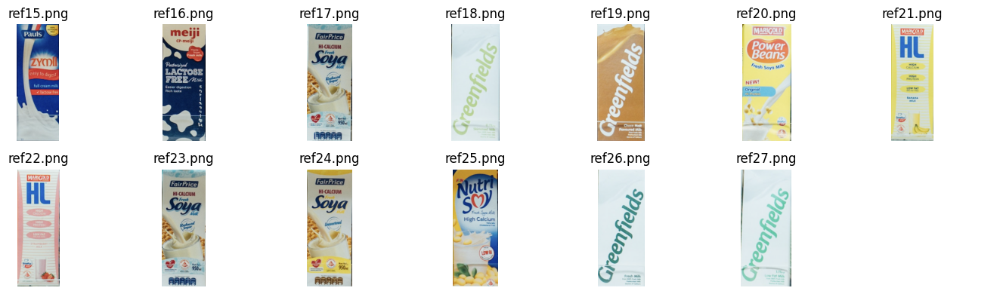

In [175]:
fig, axes = plt.subplots(2, 7, figsize=(14, 4))
axes = axes.flatten()

for i, image in enumerate(products_b):
    axes[i].imshow(cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2RGB))
    axes[i].axis('off')
    axes[i].set_title(image[len(models_path):])
    if i==len(products_b)-1:
        for ax in axes[i+1:]:
            ax.axis('off')

plt.tight_layout()
plt.show()

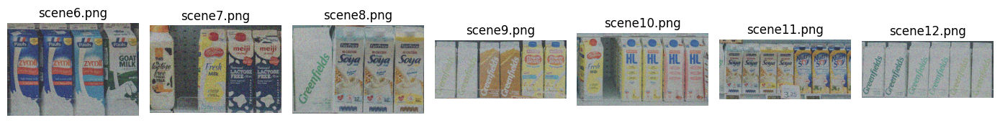

In [176]:
fig, axes = plt.subplots(1, 7, figsize=(14, 4))
axes = axes.flatten()

for i, image in enumerate(scenes_b):
    axes[i].imshow(cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2RGB))
    axes[i].axis('off')
    axes[i].set_title(image[len(scenes_path):])

plt.tight_layout()
plt.show()

## TRACK A

In [177]:
MAX=225

def window_elements(P, W, i, j):
    elements=P[max(0,i-(W-1)//2):min(P.shape[0]-1,i+(W-1)//2)+1,max(0,j-(W-1)//2):min(P.shape[1]-1,j+(W-1)//2)+1]
    return elements.reshape((np.prod(elements.shape),))


def uncorrupted(a):
    return a[(a > 0) & (a < MAX)]


def find_median(a):
    return np.median(a)


def find_mean(a):
    return np.mean(a)


def only_0_and_MAX(a):
    for element in a:
        if element!=0 and element !=MAX:
            return False
    return True


def only_0(a):
    for element in a:
        if element!=0:
            return False
    return True


def only_MAX(a):
    for element in a:
        if element!=MAX:
            return False
    return True

def adaptive_approach(P):
    W=3
    h=2
    Wmax=9
    width,height=P.shape
    for i in range(width):
        for j in range(height):
            # print(j)
            if P[i,j]>0 and P[i,j]<MAX:
                # print('non corrotto', P[i,j])
                continue
            v=window_elements(P,W,i,j)
            V=uncorrupted(v)
            N=len(V)
            while W<=Wmax:
                if N>=W:
                    # print('n>=W', P[i,j])
                    P[i,j]=find_median(V)
                    break
                if W<Wmax:
                    if N<W: #case I
                        W+=h
                        v=window_elements(P,W,i,j)
                        V=uncorrupted(v)
                        N=len(V)
                        # print(W,N)
                        # print('1')
                    else: #case II
                        P[i,j]=find_median(V)
                        W=3
                        # print('2')
                        break
                if W==Wmax:
                    if N<W and N!=0: #caseIII
                        P[i,j]=find_mean(V)
                        # print('3')
                        break
                    if only_0_and_MAX(v): #caseIV
                        P[i,j]=find_mean(v)
                        # print('4')
                        break
                    if only_0(v): #caseV
                        P[i,j]=MAX
                        # print('5')
                        break
                    if only_MAX(v): #caseVI
                        P[i,j]=0
                        # print('6')
                        break
    return P


def denoise_image(image, filters):
    '''
    filters=[
        {name:filter1
            n_iter:...,
            params:{
                ...
            }
        },
        {name:filter2
            n_iter:...,
            params:{
                ...
            }
        },
        ...
    ]
    '''
    for filter in filters:
        for _ in range(filter['n_iter']):
            match filter['name']:
                case "mean":
                    '''
                    {"ksize" : 15}
                    '''
                    k_size = filter['params']['ksize']
                    mean_kernel = np.ones([k_size, k_size])/(k_size**2)
                    image = cv2.filter2D(image, -1, mean_kernel)

                case "median":
                    '''
                    {"ksize" : 11}
                    '''
                    image = cv2.medianBlur(image, **filter['params'])

                case "bilateral":
                    '''
                    {"d" : 3,
                    "sigmaColor" : 2,
                    "sigmaSpace" : 1.5}
                    '''
                    image = cv2.bilateralFilter(
                        image, **filter['params'])

                case 'gaussian':
                    '''
                    {"sigmaX" : 2}
                    '''
                    sigmaX = filter['params']['sigmaX']
                    ksize = 2*int(np.ceil(3*sigmaX)) + 1
                    image = cv2.GaussianBlur(image, (ksize, ksize), sigmaX)

                case 'non_local_means':
                    '''
                    {'templateWindowSize':5,"searchWindowSize":21, "h":3, "hColor": 20}
                    '''
                    image = cv2.fastNlMeansDenoisingColored(
                        image, **filter['params'])

                case 'canny':
                    '''
                    {'threshold1':5,"threshold2":21}
                    '''
                    image = cv2.Canny(image, **filter['params'])

                case "adaptive":
                    channel1 = image[:, :, 0]
                    channel2 = image[:, :, 1]
                    channel3 = image[:, :, 2]
                    image[:, :, 0] = adaptive_approach(channel1)
                    image[:, :, 1] = adaptive_approach(channel2)
                    image[:, :, 2] = adaptive_approach(channel3)

                case 'sharpen':
                    kernel = np.array([[0, -1, 0],
                                       [-1, 5, -1],
                                       [0, -1, 0]])
                    image = cv2.filter2D(image, -1, kernel=kernel)

                case 'emboss':
                    kernel = np.array([[-2, -1, 0],
                                       [-1, 1, 1],
                                       [0, 1, 2]])
                    image = cv2.filter2D(image, -1, kernel=kernel)
                case _: pass
    return image

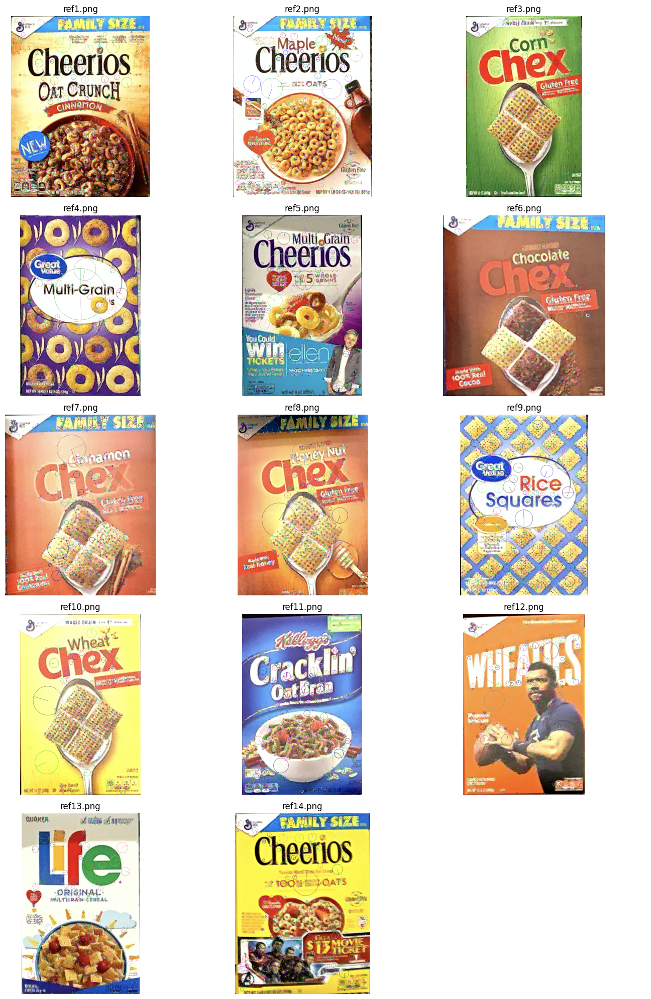

In [178]:
SHOW_FILTERED=True

products_info_a = []
fig, axes = plt.subplots(5, 3, figsize=(14, 20))
axes = axes.flatten()


for i, product in enumerate(products_a):
    image = cv2.imread(product)
    sift = cv2.xfeatures2d.SIFT_create()
    keypoints = sift.detect(image)
    products_info_a.append(list(sift.compute(image, keypoints))+[image.shape])
    if SHOW_FILTERED:
        img_kp = cv2.drawKeypoints(image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        axes[i].imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
        axes[i].axis('off')
        axes[i].set_title(product[len(models_path):])
        if i==len(products_a)-1:
            for ax in axes[i+1:]:
                ax.axis('off')

plt.tight_layout()
plt.show()

In [179]:
def normalize(image):
    return (image.astype(float)*255.0/225).astype('uint8')

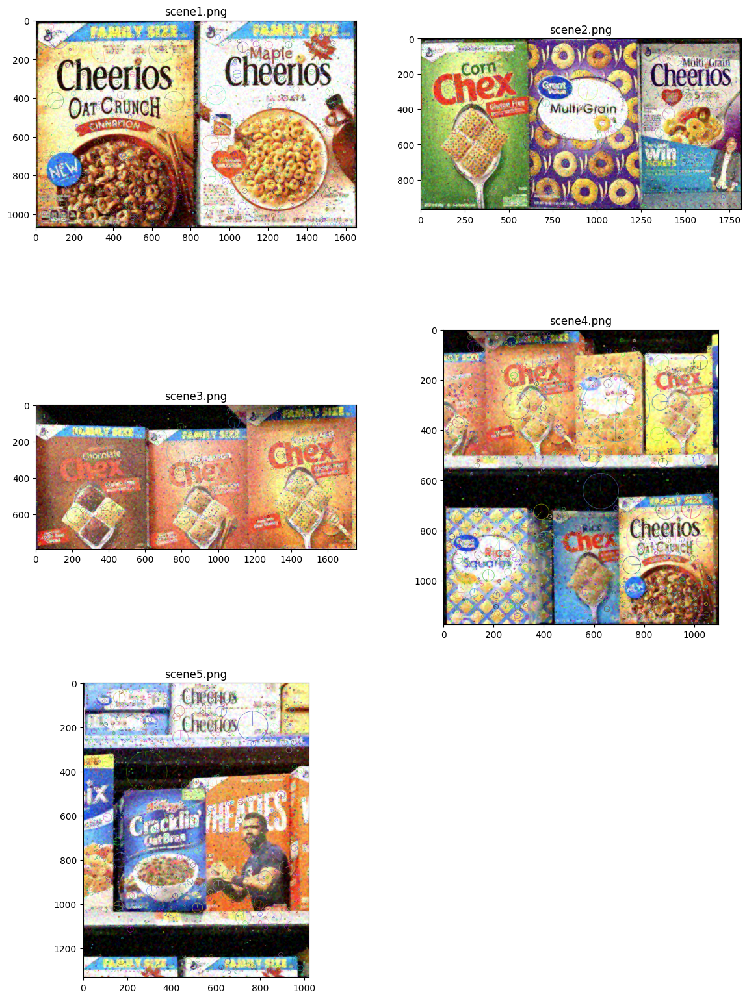

In [195]:
SHOW_FILTERED = True
# Working settings:
# [{'name': 'median', 'n_iter': 2, 'params': {'ksize': 3}},
#  {'name': 'median', 'n_iter': 2, 'params': {'ksize': 5}},
#  {'name': 'median', 'n_iter': 1, 'params': {'ksize': 7}},
#  {'matching_settings': {'min_match': 40,
#    'check_position': 'overlapping_center'}}]
settings_a = [
    {'name': 'adaptive',
        'n_iter': 0,
     },
    {'name': "median",
        "n_iter": 2,
        "params": {"ksize": 3}
     },
    {'name': "median",
        "n_iter": 2,
        "params": {"ksize": 5}
     },
    {'name': "median",
        "n_iter": 1,
        "params": {"ksize": 7}
     },
    {'name': "median",
        "n_iter": 0,
        "params": {"ksize": 3}
     },
    {'name': "median",
        "n_iter": 0,
        "params": {"ksize": 5}
     },
    {'name': 'emboss',
        'n_iter': 0,
     },
    {'name': "median",
        "n_iter": 0,
        "params": {"ksize": 3}
     },
    {'name': "median",
        "n_iter": 0,
        "params": {"ksize": 9}
     },
    {'name': "gaussian",
        "n_iter": 0,
        "params": {"sigmaX": 1.5}
     },
    {'name': "mean",
        "n_iter": 0,
        "params": {"ksize": 15}
     },
    {'name': "bilateral",
        "n_iter": 0,
        "params": {"d": 9,
                   "sigmaColor": 150,
                   "sigmaSpace": 150}
     },
    {'name': "non_local_means",
        "n_iter": 0,
        "params": {
            'templateWindowSize': 9,
            "searchWindowSize": 21,
            "h": 3,
            "hColor": 20}
     },
    {'name': "canny",
        "n_iter": 0,
        "params": {
            'threshold1': 100,
            "threshold2": 200}
     },
]


fig, axes = plt.subplots(3, 2, figsize=(14, 20))
axes = axes.flatten()

scene_info_a = []
for i, scene in enumerate(scenes_a):
    image = cv2.imread(scene)
    image = normalize(image)
    filtered_image = denoise_image(image, settings_a)
    sift = cv2.xfeatures2d.SIFT_create()
    keypoints = sift.detect(filtered_image)
    scene_info_a.append(list(sift.compute(filtered_image, keypoints))+[image.shape])
    if SHOW_FILTERED:
        img_kp = cv2.drawKeypoints(
            filtered_image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        axes[i].imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
        # axes[i].axis('off')
        axes[i].set_title(scene[len(scenes_path):])
        if i == len(scenes_a)-1:
            for ax in axes[i+1:]:
                ax.axis('off')
# display_used(settings)

(968, 1816, 3)


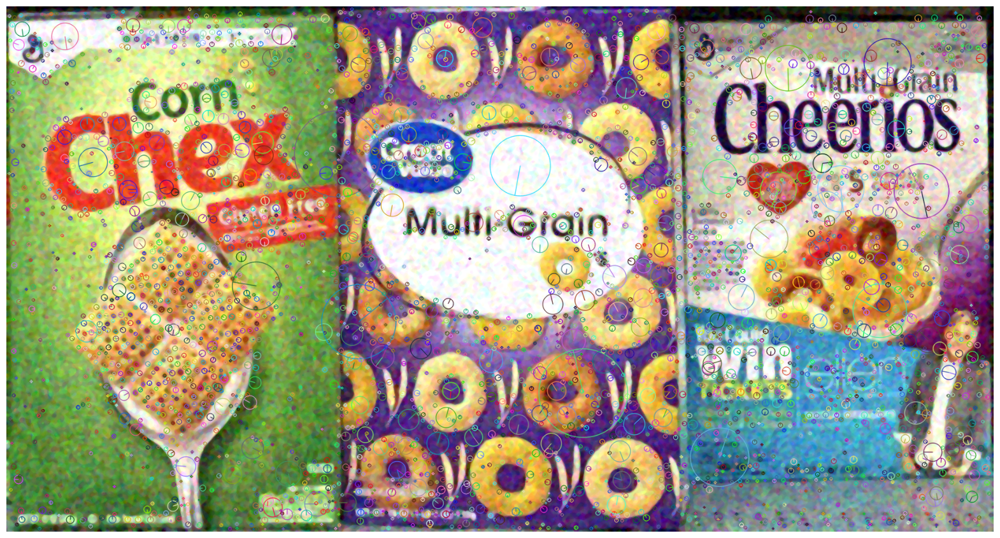

In [181]:
image = cv2.imread(scenes_a[1])
image=normalize(image)
filtered_image = denoise_image(image, settings[:-1])
sift = cv2.xfeatures2d.SIFT_create()
keypoints = sift.detect(filtered_image)
img_kp = cv2.drawKeypoints(
    filtered_image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.figure(figsize=(20,20))
plt.imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
plt.axis('off');
print(image.shape)

In [182]:
def diagonal(points,point2=None):
    if point2:
        return np.sqrt((points[0]-point2[0])**2+(points[1]-point2[1])**2)
    return np.sqrt(np.sum(np.subtract(points[:1,:],points[1:,:])**2))

def get_geometry(corners):
    return {'position': tuple(np.round((np.sum(corners,axis=0)/4)[0],0).astype(int)),
        'width': f'{diagonal(corners[:2,:]):0.0f}px',
        'height': f'{diagonal(corners[1:3,:]):0.0f}px'
    }

In [183]:
results_a = {}

for i, scene in enumerate(scene_info_a, 1):
    results_a[i] = {}
    for j, product in enumerate(products_info_a, 1):
        FLANN_INDEX_KDTREE = 1
        index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
        search_params = dict(checks=50)

        flann = cv2.FlannBasedMatcher(index_params, search_params)
        matches = flann.knnMatch(product[1], scene[1], k=2)
        good = []
        for m, n in matches:
            if m.distance < 0.7*n.distance:
                good.append(m)
        num_matches = len(good)
        try: # da errori del cazzo non lo so
            src_pts = np.float32(
                [product[0][m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
            dst_pts = np.float32(
                [scene[0][m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

            M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

            matchesMask = mask.ravel().tolist()

            h, w, z = product[2]
            pts = np.float32([[0, 0], [0, h-1], [w-1, h-1],
                            [w-1, 0]]).reshape(-1, 1, 2)

            dst = np.int32(cv2.perspectiveTransform(pts, M))

            results_a[i][j] = {
                'match_count': num_matches,
                'geometry': get_geometry(dst),
                'flag':True
            }
        except cv2.error:
            print('cv2 error',f'scene {i} prod {j}')
            pass

In [248]:
def display_used(settings):
    aux=[filter for filter in settings if ( 'matching_settings' in filter.keys() or filter['n_iter']>0)]
    display(aux)


def inside(center,image_shape): # center is (x;y), shape is (rows,columns)
    # return True
    return (center[0]>=0 and center[0]<image_shape[1]) and (center[1]>=0 and center[1]<image_shape[0])


def check_boundings(point,rectangle, tollerance=None):
    try:
        pointX,pointY=point
        centerX,centerY=rectangle['position']
        sizeX=int(rectangle['width'][:-2])
        sizeY=int(rectangle['height'][:-2])
        return (centerX-sizeX/2<=pointX and pointX<=centerX+sizeX/2) and (centerY-sizeY/2<=pointY and pointY<=centerY+sizeY/2)
    except ValueError:
        return False

def flag_same_products_SI(results,method='overlapping_center',method_param=50,show_concentric_texts=False):
    '''
    per ogni scena 
        per ogni coppia di prodotti
            se hanno lo "stesso" centro flaggo a False quello con meno matches
    '''
    for scene in results.keys():
        keys=list(results[scene].keys())
        for i,product1 in enumerate(keys):
            # results[scene][product1]["flag"]=True
            for product2 in keys[i+1:]:
                match method:
                    case 'center_vicinity':
                        if diagonal(results[scene][product1]["geometry"]["position"],results[scene][product2]["geometry"]["position"])<method_param:
                            if show_concentric_texts:
                                print(f'scene {scene}: products {product1} and {product2} are found to be concentric')
                            if results[scene][product1]["match_count"]>results[scene][product2]["match_count"]:
                                results[scene][product2]["flag"]=False
                            else:
                                results[scene][product1]["flag"]=False
                    case 'overlapping_center':
                        point=results[scene][product1]["geometry"]["position"] # tuple (x,y)
                        if check_boundings(point,results[scene][product2]["geometry"]):
                            if show_concentric_texts:
                                print(f'scene {scene}: products {product1} and {product2} are found to be concentric')
                            if results[scene][product1]["match_count"]>results[scene][product2]["match_count"]:
                                results[scene][product2]["flag"]=False
                            else:
                                results[scene][product1]["flag"]=False
                            
                    case _:
                        pass


def print_single_instances(results: dict,min_match,check_pos):
    max_product_len = max(len(str(product)) for scene in results for product in results[scene].keys())
    max_match_len = max(len(str(results[scene][product]["match_count"])) for scene in results for product in results[scene])
    max_x_len = max(len(str(results[scene][product]["geometry"]["position"][0])) for scene in results for product in results[scene] if inside(results[scene][product]['geometry']['position'], scene_info_a[scene-1][2]))
    max_y_len = max(len(str(results[scene][product]["geometry"]["position"][1])) for scene in results for product in results[scene] if inside(results[scene][product]['geometry']['position'], scene_info_a[scene-1][2]))
    max_width_len = max(len(str(results[scene][product]["geometry"]["width"])) for scene in results for product in results[scene])
    max_height_len = max(len(str(results[scene][product]["geometry"]["height"])) for scene in results for product in results[scene])

    for scene in results.keys():
        print(f'Scene {scene}:')
        for product in results[scene].keys():
            # print(results[scene][product]['geometry']['position'])
            if (results[scene][product]['match_count'] >= min_match and 
                 #set to false in `flag_concentric_refs` if refs refers to the same product (they both think to be the same product) 
                results[scene][product]['flag'] and
                (
                    (not check_pos) or 
                    inside(results[scene][product]['geometry']['position'], scene_info_a[scene-1][2])
                )  
                ):
                print(f"\tProduct {f'{product},':<{max_product_len+1}}"
                    + f" matches: {f'{results[scene][product]['match_count']},':<{max_match_len+1}}"
                    + f" {{position: ({str(results[scene][product]['geometry']['position'][0]):<{max_x_len}},"
                    + f" {f'{str(results[scene][product]['geometry']['position'][1])}':<{max_y_len-1}}),"
                    + f" width: {f'{results[scene][product]['geometry']['width']}':<{max_width_len-1}},"
                    + f" height: {results[scene][product]['geometry']['height']:<{max_height_len-1}}}}"
                    )

In [249]:
MIN_MATCH_COUNT = 35
CHECK_CENTER_POSITION = True
CHECK_METHOD='overlapping_center' # 'center_vicinity' or 'overlapping_center'
MIN_CENTER_DISTANCE=50
if 'matching_settings' in settings_a[-1].keys():
    settings_a[-1]={'matching_settings':{'min_match':MIN_MATCH_COUNT,
                  'check_position':CHECK_METHOD if CHECK_CENTER_POSITION else CHECK_CENTER_POSITION}}
else:
    settings_a.append({'matching_settings':{'min_match':MIN_MATCH_COUNT,
                     'check_position':CHECK_METHOD if CHECK_CENTER_POSITION else CHECK_CENTER_POSITION}})
            
print('Denoise settings:')
display_used(settings_a)

flag_same_products_SI(results_a,method= CHECK_METHOD,method_param=MIN_CENTER_DISTANCE,show_concentric_texts=False)
print_single_instances(results_a,MIN_MATCH_COUNT,CHECK_CENTER_POSITION)

Denoise settings:


[{'name': 'median', 'n_iter': 2, 'params': {'ksize': 3}},
 {'name': 'median', 'n_iter': 2, 'params': {'ksize': 5}},
 {'name': 'median', 'n_iter': 1, 'params': {'ksize': 7}},
 {'matching_settings': {'min_match': 35,
   'check_position': 'overlapping_center'}}]

Scene 1:
	Product 1,  matches: 509, {position: (412 , 539), width: 1049px, height: 803px }
	Product 2,  matches: 426, {position: (1248, 533), width: 1047px, height: 803px }
Scene 2:
	Product 3,  matches: 230, {position: (304 , 494), width: 944px , height: 605px }
	Product 4,  matches: 199, {position: (928 , 483), width: 948px , height: 634px }
	Product 5,  matches: 227, {position: (1528, 450), width: 842px , height: 561px }
Scene 3:
	Product 6,  matches: 90,  {position: (298 , 458), width: 672px , height: 599px }
	Product 7,  matches: 90,  {position: (888 , 460), width: 650px , height: 540px }
	Product 8,  matches: 135, {position: (1446, 398), width: 779px , height: 557px }
Scene 4:
	Product 1,  matches: 136, {position: (887 , 914), width: 505px , height: 376px }
	Product 8,  matches: 57,  {position: (348 , 259), width: 497px , height: 355px }
	Product 9,  matches: 71,  {position: (174 , 944), width: 460px , height: 328px }
	Product 10, matches: 44,  {position: (939 , 290), width: 396p

solutions:
scene1:1,2  
scene2:3,4,5  
scene3:6,7,8  
scene4:1,(7),8,9,10  
scene5:2,11,12  

## TRACK B

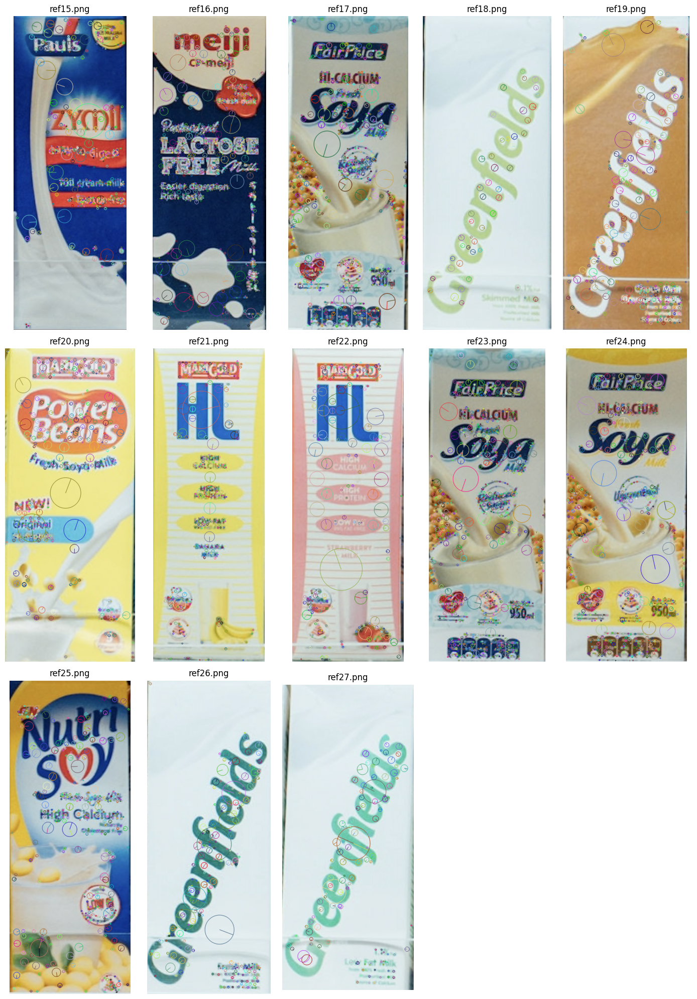

In [186]:
SHOW_FILTERED=True

products_info_b = []
fig, axes = plt.subplots(3, 5, figsize=(14, 20))
axes = axes.flatten()


for i, product in enumerate(products_b):
    image = cv2.imread(product)
    sift = cv2.xfeatures2d.SIFT_create()
    keypoints = sift.detect(image)
    products_info_b.append(list(sift.compute(image, keypoints))+[image.shape])
    if SHOW_FILTERED:
        img_kp = cv2.drawKeypoints(image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        axes[i].imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
        axes[i].axis('off')
        axes[i].set_title(product[len(models_path):])
        if i==len(products_b)-1:
            for ax in axes[i+1:]:
                ax.axis('off')

plt.tight_layout()
plt.show()

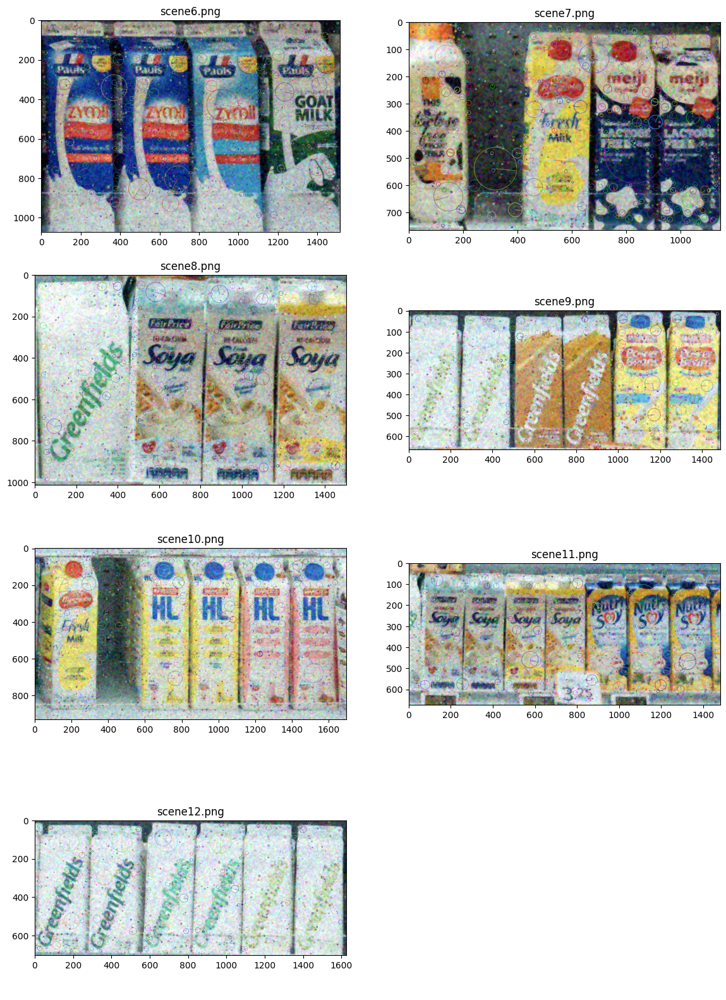

In [194]:
SHOW_FILTERED = True
# Working settings:
# [{'name': 'median', 'n_iter': 2, 'params': {'ksize': 3}},
#  {'name': 'median', 'n_iter': 2, 'params': {'ksize': 5}},
#  {'name': 'median', 'n_iter': 1, 'params': {'ksize': 7}},
#  {'matching_settings': {'min_match': 40,
#    'check_position': 'overlapping_center'}}]
settings_b = [
    {'name': 'adaptive',
        'n_iter': 0,
     },
    {'name': "median",
        "n_iter": 2,
        "params": {"ksize": 3}
     },
    {'name': "median",
        "n_iter": 2,
        "params": {"ksize": 5}
     },
    {'name': "median",
        "n_iter": 1,
        "params": {"ksize": 7}
     },
    {'name': "median",
        "n_iter": 0,
        "params": {"ksize": 3}
     },
    {'name': "median",
        "n_iter": 0,
        "params": {"ksize": 5}
     },
    {'name': 'emboss',
        'n_iter': 0,
     },
    {'name': "median",
        "n_iter": 0,
        "params": {"ksize": 3}
     },
    {'name': "median",
        "n_iter": 0,
        "params": {"ksize": 9}
     },
    {'name': "gaussian",
        "n_iter": 0,
        "params": {"sigmaX": 1.5}
     },
    {'name': "mean",
        "n_iter": 0,
        "params": {"ksize": 15}
     },
    {'name': "bilateral",
        "n_iter": 0,
        "params": {"d": 9,
                   "sigmaColor": 150,
                   "sigmaSpace": 150}
     },
    {'name': "non_local_means",
        "n_iter": 0,
        "params": {
            'templateWindowSize': 9,
            "searchWindowSize": 21,
            "h": 3,
            "hColor": 20}
     },
    {'name': "canny",
        "n_iter": 0,
        "params": {
            'threshold1': 100,
            "threshold2": 200}
     },
]


fig, axes = plt.subplots(4, 2, figsize=(14, 20))
axes = axes.flatten()

scene_info_b = []
for i, scene in enumerate(scenes_b):
    image = cv2.imread(scene)
    image = normalize(image)
    filtered_image = denoise_image(image, settings_b)
    sift = cv2.xfeatures2d.SIFT_create()
    keypoints = sift.detect(filtered_image)
    scene_info_b.append(list(sift.compute(filtered_image, keypoints))+[image.shape])
    if SHOW_FILTERED:
        img_kp = cv2.drawKeypoints(
            filtered_image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        axes[i].imshow(cv2.cvtColor(img_kp, cv2.COLOR_BGR2RGB))
        # axes[i].axis('off')
        axes[i].set_title(scene[len(scenes_path):])
        if i == len(scenes_b)-1:
            for ax in axes[i+1:]:
                ax.axis('off')

In [191]:
results_b = {}

for i, scene in enumerate(scene_info_b, 1):
    results_b[i] = {}
    for j, product in enumerate(products_info_b, 1):
        results_b[i][j]=[]
        FLANN_INDEX_KDTREE = 1
        index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
        search_params = dict(checks=50)

        flann = cv2.FlannBasedMatcher(index_params, search_params)
        matches = flann.knnMatch(product[1], scene[1], k=2)
        good = []
        for m, n in matches:
            if m.distance < 0.7*n.distance:
                good.append(m)
        num_matches = len(good)
        try:
            src_pts = np.float32(
                [product[0][m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
            dst_pts = np.float32(
                [scene[0][m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

            M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

            matchesMask = mask.ravel().tolist()

            h, w, z = product[2]
            pts = np.float32([[0, 0], [0, h-1], [w-1, h-1],
                            [w-1, 0]]).reshape(-1, 1, 2)

            dst = np.int32(cv2.perspectiveTransform(pts, M))

            results_b[i][j].append({
                'match_count': num_matches,
                'geometry': get_geometry(dst),
                'flag':True}
            )
        except cv2.error:
            print('cv2 error',f'scene {i} prod {j}')
            pass

cv2 error scene 1 prod 4
cv2 error scene 1 prod 5
cv2 error scene 1 prod 6
cv2 error scene 1 prod 7
cv2 error scene 1 prod 8
cv2 error scene 1 prod 11
cv2 error scene 1 prod 12
cv2 error scene 1 prod 13
cv2 error scene 2 prod 1
cv2 error scene 2 prod 3
cv2 error scene 2 prod 4
cv2 error scene 2 prod 5
cv2 error scene 2 prod 7
cv2 error scene 2 prod 11
cv2 error scene 2 prod 12
cv2 error scene 2 prod 13
cv2 error scene 3 prod 1
cv2 error scene 3 prod 5
cv2 error scene 3 prod 6
cv2 error scene 3 prod 7
cv2 error scene 3 prod 8
cv2 error scene 3 prod 11
cv2 error scene 4 prod 1
cv2 error scene 4 prod 4
cv2 error scene 4 prod 7
cv2 error scene 4 prod 8
cv2 error scene 4 prod 9
cv2 error scene 4 prod 10
cv2 error scene 4 prod 11
cv2 error scene 4 prod 13
cv2 error scene 5 prod 1
cv2 error scene 5 prod 4
cv2 error scene 5 prod 9
cv2 error scene 5 prod 10
cv2 error scene 5 prod 11
cv2 error scene 5 prod 13
cv2 error scene 6 prod 1
cv2 error scene 6 prod 2
cv2 error scene 6 prod 4
cv2 error sc

In [283]:
def flag_same_products_MI(results,method='overlapping_center',method_param=50,show_concentric_texts=False):
    '''
    per ogni scena 
        per ogni coppia di istanza
            se hanno lo "stesso" centro flaggo a False quella con meno matches
    '''
    for scene in results.keys():
        keys=list(results[scene].keys())
        for i,product1 in enumerate(keys):
            for product2 in keys[i+1:]:
                for instance1 in range(len(results[scene][product1])):
                    for instance2 in range(len(results[scene][product2])):
                        match method:
                            case 'center_vicinity':
                                if diagonal(results[scene][product1][instance1]["geometry"]["position"],results[scene][product2][instance2]["geometry"]["position"])<method_param:
                                    if show_concentric_texts:
                                        print(f'scene {scene}: products {product1} and {product2} are found to be concentric')
                                    if results[scene][product1][instance1]["match_count"]>results[scene][product2][instance2]["match_count"]:
                                        results[scene][product2][instance2]["flag"]=False
                                    else:
                                        results[scene][product1][instance1]["flag"]=False
                            case 'overlapping_center':
                                point=results[scene][product1][instance1]["geometry"]["position"] # tuple (x,y)
                                if check_boundings(point,results[scene][product2][instance2]["geometry"]):
                                    if show_concentric_texts:
                                        print(f'scene {scene}: products {product1} and {product2} are found to be concentric')
                                    if results[scene][product1][instance1]["match_count"]>results[scene][product2][instance2]["match_count"]:
                                        results[scene][product2][instance2]["flag"]=False
                                    else:
                                        results[scene][product1][instance1]["flag"]=False
                                    
                            case _:
                                pass


'''
    results_b={
        scene_index:{
            product_1_index:[
                {
                    'match_count':n,
                    'geometry':geom_dict (see get_geometry()),
                    'flag':Bool
                },
                {
                    'match_count':n,
                    'geometry':geom_dict (see get_geometry()),
                    'flag':Bool
                },
                ...
            ],
            ...
        },
        ...
    }
'''
def print_multiple_instances(results: dict,min_match,check_pos):
    max_product_len = max(len(str(product)) for scene in results for product in results[scene].keys())
    max_match_len = max(len(str(product["match_count"])) for scene in results for products in results[scene] for product in results[scene][products])
    max_x_len = max(len(str(product["geometry"]["position"][0])) for scene in results for products in results[scene] for product in results[scene][products] if inside(product['geometry']['position'], scene_info_b[scene-1][2]))
    max_y_len = max(len(str(product["geometry"]["position"][1])) for scene in results for products in results[scene] for product in results[scene][products] if inside(product['geometry']['position'], scene_info_b[scene-1][2]))
    max_width_len = max(len(str(product["geometry"]["width"])) for scene in results for products in results[scene] for product in results[scene][products])
    max_height_len = max(len(str(product["geometry"]["height"])) for scene in results for products in results[scene] for product in results[scene][products])

    for scene in results.keys():
        print(f'Scene {scene}:')
        for products in results[scene].keys():
            printable_prods=[]
            for product in results[scene][products]:
                if (product['match_count'] >= min_match and 
                    product['flag'] and 
                    (
                        (not check_pos) or 
                        inside(product['geometry']['position'], scene_info_b[scene-1][2])
                    )):
                    printable_prods.append(product)
            num_inside=len(printable_prods)
            if num_inside>0:
                print(f"\tProduct {products:<{max_product_len}} - {num_inside} instance found:")
                for i,product in enumerate(printable_prods,1):
                    print(f"\t\tInstance {i},"
                        + f" matches: {f'{product['match_count']},':<{max_match_len+1}}"
                        + f" {{position: ({str(product['geometry']['position'][0]):<{max_x_len}}"
                        + f", {f'{str(product['geometry']['position'][1])}':<{max_y_len-1}}),"
                        + f" width: {f'{product['geometry']['width']}':<{max_width_len-1}},"
                        + f" height: {product['geometry']['height']:<{max_height_len-1}}}}"
                        )

print_multiple_instances(
    results={1: {
        1: [
            {'match_count': 509, 'geometry': {'position': (412, 539), 'width': '1049px', 'height': '803px'}, 'flag': True},
            {'match_count': 45, 'geometry': {'position': (412, 539), 'width': '1049px', 'height': '803px'}, 'flag': True}
            ],
        2: [{'match_count': 426, 'geometry': {'position': (1248, 533), 'width': '1047px', 'height': '803px'}, 'flag': True}],
        3: [{'match_count': 26, 'geometry': {'position': (1169, 1000), 'width': '300px', 'height': '1690px'}, 'flag': False}],
        4: [{'match_count': 30, 'geometry': {'position': (920, 642), 'width': '3px', 'height': '2px'}, 'flag': False}],
        5: [{'match_count': 81, 'geometry': {'position': (1246, 562), 'width': '1004px', 'height': '712px'}, 'flag': False}],
        6: [{'match_count': 13, 'geometry': {'position': (1457, 111), 'width': '314px', 'height': '1770px'}, 'flag': True}],
        7: [{'match_count': 13, 'geometry': {'position': (553486, 37480), 'width': '26242px', 'height': '1159px'}, 'flag': True}],
        8: [{'match_count': 21, 'geometry': {'position': (92, 801), 'width': '21px', 'height': '1px'}, 'flag': True}],
        9: [],
        10:[ {'match_count': 15, 'geometry': {'position': (510, 44), 'width': '310px', 'height': '25px'}, 'flag': True}],
        11:[],
        12:[ {'match_count': 7, 'geometry': {'position': (2499, -3400), 'width': '17176px', 'height': '19063px'}, 'flag': False}],
        13:[ {'match_count': 31, 'geometry': {'position': (1072, 508), 'width': '0px', 'height': '0px'}, 'flag': False}],
        14:[ {'match_count': 73, 'geometry': {'position': (1245, 616), 'width': '1037px', 'height': '888px'}, 'flag': False}]
    }},
    min_match=1,check_pos=True)

Scene 1:
	Product 1  - 2 instance found:
		Instance 1, matches: 509, {position: (412 , 539), width: 1049px, height: 803px }
		Instance 2, matches: 45,  {position: (412 , 539), width: 1049px, height: 803px }
	Product 2  - 1 instance found:
		Instance 1, matches: 426, {position: (1248, 533), width: 1047px, height: 803px }
	Product 6  - 1 instance found:
		Instance 1, matches: 13,  {position: (1457, 111), width: 314px , height: 1770px}
	Product 8  - 1 instance found:
		Instance 1, matches: 21,  {position: (92  , 801), width: 21px  , height: 1px   }
	Product 10 - 1 instance found:
		Instance 1, matches: 15,  {position: (510 , 44 ), width: 310px , height: 25px  }


In [275]:
MIN_MATCH_COUNT = 35
CHECK_CENTER_POSITION = True
CHECK_METHOD='overlapping_center' # 'center_vicinity' or 'overlapping_center'
MIN_CENTER_DISTANCE=50
if 'matching_settings' in settings_b[-1].keys():
    settings_b[-1]={'matching_settings':{'min_match':MIN_MATCH_COUNT,
                  'check_position':CHECK_METHOD if CHECK_CENTER_POSITION else CHECK_CENTER_POSITION}}
else:
    settings_b.append({'matching_settings':{'min_match':MIN_MATCH_COUNT,
                     'check_position':CHECK_METHOD if CHECK_CENTER_POSITION else CHECK_CENTER_POSITION}})
            
print('Denoise settings:')
display_used(settings_b)

flag_same_products_MI(results_b,method= CHECK_METHOD,method_param=MIN_CENTER_DISTANCE,show_concentric_texts=False)
print_single_instances(results_b,MIN_MATCH_COUNT,CHECK_CENTER_POSITION)

NameError: name 'settings_b' is not defined

```
Product 0 - 2 instance found:
  Instance 1 {position: (256, 328), width: 57px, height: 80px}
  Instance 2 {position: (311, 328), width: 57px, height: 80px}
Product 1 – 1 instance found:
.
.
.
```

scene6:15,15  
scene7:16,16  
scene8:23,23,24,27  
scene9:18,18,19,19,20,20  
scene10:21,21,22,22  
scene11:23,23,24,24,25,25,(27)  
scene12:18,18,26,26,27,27